In [2]:
# Import pandas, plotly
import pandas as pd
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go

init_notebook_mode(connected=True)

# Let's investigate the dataset at first
reviews = pd.read_csv('data/winemag-data-130k-v2.csv', index_col=0)
reviews.head(50)

,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks
5,Spain,Blackberry and raspberry aromas show a typical...,Ars In Vitro,87,15.0,Northern Spain,Navarra,NaN,Michael Schachner,@wineschach,Tandem 2011 Ars In Vitro Tempranillo-Merlot (N...,Tempranillo-Merlot,Tandem
6,Italy,"Here's a bright, informal red that opens with ...",Belsito,87,16.0,Sicily & Sardinia,Vittoria,NaN,Kerin O’Keefe,@kerinokeefe,Terre di Giurfo 2013 Belsito Frappato (Vittoria),Frappato,Terre di Giurfo
7,France,This dry and restrained wine offers spice in p...,NaN,87,24.0,Alsace,Alsace,NaN,Roger Voss,@vossroger,Trimbach 2012 Gewurztraminer (Alsace),Gewürztraminer,Trimbach
8,Germany,Savory dried thyme notes accent sunnier flavor...,Shine,87,12.0,Rheinhessen,NaN,NaN,Anna Lee C. Iijima,NaN,Heinz Eifel 2013 Shine Gewürztraminer (Rheinhe...,Gewürztraminer,Heinz Eifel
9,France,This has great depth of flavor with its fresh ...,Les Natures,87,27.0,Alsace,Alsace,NaN,Roger Voss,@vossroger,Jean-Baptiste Adam 2012 Les Natures Pinot Gris...,Pinot Gris,Jean-Baptiste Adam


<AxesSubplot:xlabel='price', ylabel='points'>

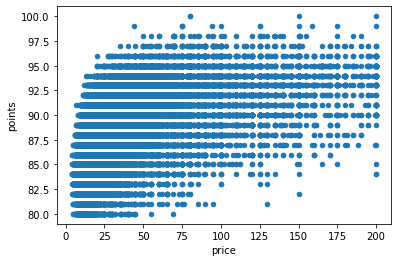

In [3]:
rev_scatter=reviews[reviews['price']<=200]
rev_scatter.plot.scatter(x='price', y='points')


In [28]:

fig = px.scatter(x=reviews['price'], y=reviews['points'])
fig.show()

In [3]:
#reviews.sample(100).plot.hexbin(x='price', y='points')

In [4]:
import json
worldmap = json.load(open('data/map.geojson','r'))
#worldmap['features'][1]['properties']

In [5]:
country_id_map={}
for feature in worldmap['features']:
    feature['id'] = feature['properties']['iso_n3']
    country_id_map[feature['properties']['sovereignt']] = feature['id']
    

In [6]:
reviews['country']
#Changing countries names
reviews.dropna(axis=0,subset=['country'], inplace=True)
reviews['country'] = reviews['country'].replace({"US":"United States of America", "England": "United Kingdom","Serbia":"Republic of Serbia"})

reviews['id']= reviews['country'].apply(lambda x: country_id_map[x])

reviews.head()


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery,id
0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia,380
1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos,620
2,United States of America,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm,840
3,United States of America,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian,840
4,United States of America,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks,840


In [7]:

plot=px.choropleth(reviews, locations='id', geojson=worldmap, color='price',range_color=(0, 80))
#price=reviews['price'].tolist()
#country_id=reviews['id'].tolist()

plot.show()

taster_name,Alexander Peartree,Anna Lee C. Iijima,Anne Krebiehl MW,Carrie Dykes,Christina Pickard,Fiona Adams,Jeff Jenssen,Jim Gordon,Joe Czerwinski,Kerin O’Keefe,Lauren Buzzeo,Matt Kettmann,Michael Schachner,Mike DeSimone,Paul Gregutt,Roger Voss,Sean P. Sullivan,Susan Kostrzewa,Virginie Boone
points,,,,,,,,,,,,,,,,,,,
80,19.000000,9.000000,18.750000,0.000000,0.0,0.000000,0.000000,9.000000,13.857143,10.000000,0.000000,0.000000,13.767773,0.000000,20.000000,16.000000,18.000000,15.000000,20.833333
81,24.000000,18.000000,0.000000,43.000000,0.0,0.000000,0.000000,16.909091,16.777778,23.000000,16.428571,13.000000,14.713235,0.000000,21.476190,12.740741,18.750000,18.800000,21.600000
82,28.818182,18.259259,15.000000,24.250000,20.0,20.000000,10.500000,18.696970,16.340909,22.250000,15.888889,34.666667,14.371324,30.000000,24.300000,15.638554,21.760000,18.206897,25.500000
83,26.384615,17.850000,19.400000,23.000000,0.0,0.000000,9.666667,17.026667,14.088496,21.428571,10.280000,23.592593,14.665939,25.000000,21.489933,15.418301,21.415094,18.474576,28.673077
84,28.207547,18.848485,17.375000,29.307692,0.0,0.000000,8.250000,16.993464,17.620253,21.153846,13.812500,23.523810,15.037862,22.090909,22.670157,15.995375,19.186441,20.511278,28.878378
85,26.298507,19.716612,18.000000,26.961538,0.0,40.250000,8.909091,16.592157,17.729167,24.582245,14.677083,24.494048,15.187385,21.833333,22.882900,16.280151,19.805668,19.500000,30.534066
86,28.166667,19.800000,18.734940,30.578947,0.0,24.800000,10.600000,18.635535,19.378022,26.532731,16.435252,25.805195,16.040569,28.038462,24.617021,18.324065,21.645503,18.836601,33.133705
87,28.820896,21.304225,20.715190,31.884615,23.5,33.875000,15.254545,19.951168,22.272727,28.443099,17.570866,25.921260,18.896768,20.446809,26.276634,21.430228,25.333835,22.157360,33.044543
88,29.183673,22.166154,19.996667,32.458333,0.0,25.800000,18.974026,22.255474,24.683761,33.079625,22.459091,31.483683,22.603655,20.690141,27.011503,25.474499,28.329412,23.103704,37.604182


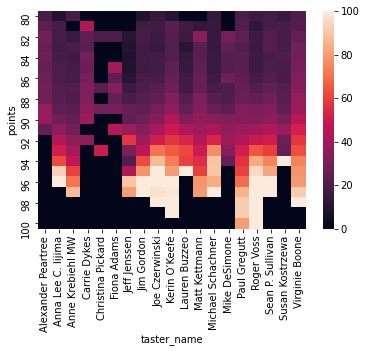

In [39]:
import seaborn as sns


reviews=reviews[reviews['price']<200]
reviews_heat = reviews.pivot_table('price','points','taster_name').fillna(0)
#reviews_heat.fillna(0)
sns.heatmap(reviews_heat, vmin=0, vmax=100)
reviews_heat

In [40]:

fig = px.imshow(reviews_heat)
fig.update_xaxes(side="top")
fig.show()


In [9]:
df = reviews.assign(n=0).groupby(['points', 'price'])['n'].count().reset_index()
df = df[df["price"] < 100]
v = df.pivot(index='price', columns='points', values='n').fillna(0)

In [11]:
fig = go.Figure(data=[go.Surface(z=v)])
fig.update_traces(contours_z=dict(show=False, usecolormap=True,
                                  highlightcolor="limegreen", project_z=True))

fig.show()
